# 🏬 **Projeto: Previsão de Intenção de Compra de Clientes em Loja Web**

**Descrição do Projeto**

Neste projeto, nosso objetivo é criar um sistema inteligente para antecipar a intenção de compra dos clientes em um site de e-commerce. **Prever quais clientes têm maior probabilidade de realizar compras online,** com base em suas características e comportamentos passados. Essa capacidade de prever a intenção de compra não só aprimorará a experiência do cliente, mas também permitirá que a empresa direcione seus esforços de marketing de forma mais eficaz.

**Objetivo**

Queremos desenvolver um modelo preditivo capaz de analisar os padrões de comportamento dos clientes e identificar sinais que indicam a propensão deles para realizar compras no site da empresa. Para isso, vamos usar uma base de dados que contém informações detalhadas sobre os clientes, incluindo:

Dados demográficos (idade, renda, etc.)

Informações sobre compras anteriores



# Base de dados:

Year_Birth: Ano de nascimento do cliente.

Education: Nível de escolaridade do cliente.

Marital_Status: Estado civil do cliente.

Income: Renda anual da família do cliente.

Kidhome: Número de crianças na casa do cliente.

Recency: Número de dias desde a última compra do cliente.

Complain: 1 se o cliente reclamou nos últimos 2 anos, 0 caso contrário.

MntWines: Valor gasto em vinhos nos últimos 2 anos.

MntFruits: Valor gasto em frutas nos últimos 2 anos.

MntMeatProducts: Valor gasto em carnes nos últimos 2 anos.

MntFishProducts: Valor gasto em peixes nos últimos 2 anos.

MntSweetProducts: Valor gasto em doces nos últimos 2 anos.

MntGoldProds: Valor gasto em produtos de ouro nos últimos 2 anos.

NumDealsPurchases: Número de compras feitas com desconto

NumStorePurchases: Número de compras feitas diretamente nas lojas.

NumWebVisitsMonth: Número de visitas ao site da empresa no último mês.






**WebPurchases: Número de compras feitas pelo site da empresa.**

# ETAPA 1:

**Preparação dos Dados**

**Exploração e Limpeza:** Analisar e limpar os dados para garantir que estejam prontos para a modelagem.

**Análise:** Construa uma storytelling com gráficos, analisando e retirando insights das informações.

In [101]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

In [102]:
base = pd.read_csv('marketing_campaign.csv', delimiter=';')

In [103]:
base

,Year_Birth,Education,Marital_Status,Income,Kidhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumStorePurchases,NumWebVisitsMonth,Complain,WebPurchases
0,1957,Graduation,Single,58138.0,0,58,635,88,546,172,88,88,4,7,0,1
1,1954,Graduation,Single,46344.0,1,38,11,1,6,2,1,6,2,5,0,0
2,1965,Graduation,Together,71613.0,0,26,426,49,127,111,21,42,10,4,0,1
3,1984,Graduation,Together,26646.0,1,26,11,4,20,10,3,5,4,6,0,0
4,1981,PhD,Married,58293.0,1,94,173,43,118,46,27,15,6,5,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1967,Graduation,Married,61223.0,0,46,709,43,182,42,118,247,4,5,0,1
2236,1946,PhD,Together,64014.0,2,56,406,0,30,0,0,8,5,7,0,1
2237,1981,Graduation,Divorced,56981.0,0,91,908,48,217,32,12,24,13,6,0,0
2238,1956,Master,Together,69245.0,0,8,428,30,214,80,30,61,10,3,0,1


**Analise exploratória da Base de Dados:**

- Tipos de Dados:

In [104]:
print(base.dtypes)

Year_Birth             int64
Education             object
Marital_Status        object
Income               float64
Kidhome                int64
Recency                int64
MntWines               int64
MntFruits              int64
MntMeatProducts        int64
MntFishProducts        int64
MntSweetProducts       int64
MntGoldProds           int64
NumStorePurchases      int64
NumWebVisitsMonth      int64
Complain               int64
WebPurchases           int64
dtype: object


- Verificação Estatistica detalhada da Base:

Para uma verificação estatistica detalhada e consolidar meu **StoryTelling**, estou fazendo uso do **pandas_profiling.**

Esse relatório facilita para observar:

- estatísticas descritivas

- distribuições

- valores faltantes

- correlações

- outliers

In [105]:
!pip install ydata-profiling

from ydata_profiling import ProfileReport

profile = ProfileReport(base, title="Relatório Estatístico", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 16/16 [00:00<00:00, 55.06it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Missing Cells ( Dados Faltantes ) - Income**

Os dados faltantes estão dentro dessa coluna, então vou analiza-la.

In [106]:
import plotly.express as px

fig = px.box(base, y="Income", title="Boxplot da Renda (Income)")
fig.show()



Vou fazer tratamento com limite de Upper Fence:

In [107]:
import numpy as np

# Calcular Q1, Q3 e IQR
Q1 = base["Income"].quantile(0.25)
Q3 = base["Income"].quantile(0.75)
IQR = Q3 - Q1

# Upper Fence
upper_fence = Q3 + 1.5 * IQR

print("Q1:", Q1)
print("Q3:", Q3)
print("IQR:", IQR)
print("Upper Fence:", upper_fence)

# Substituir outliers por limite superior (cap)
base["Income_tratado"] = np.where(base["Income"] > upper_fence, upper_fence, base["Income"])


Q1: 35303.0
Q3: 68522.0
IQR: 33219.0
Upper Fence: 118350.5


Verificando se foram realmente tratado da forma correta:

In [108]:
import plotly.express as px

# Boxplot tratado
fig2 = px.box(base, y="Income_tratado", title="Boxplot da Renda Após Tratamento de Outliers")
fig2.show()


**Dados verificando dados com valor igual a Zero e Nans:**

In [109]:
import pandas as pd

# Contar zeros por coluna
zeros_count = (base == 0).sum()

# Calcular porcentagem de zeros por coluna
zeros_percent = (zeros_count / len(base)) * 100

# Criar um DataFrame resumido
zeros_summary = pd.DataFrame({
    'zeros_count': zeros_count,
    'zeros_percent': zeros_percent
})

# Ordenar pelo número de zeros (opcional)
zeros_summary = zeros_summary.sort_values(by='zeros_count', ascending=False)

# Mostrar resultado
print(zeros_summary)


                   zeros_count  zeros_percent
Complain                  2219      99.062500
Kidhome                   1293      57.723214
WebPurchases              1112      49.642857
MntSweetProducts           419      18.705357
MntFruits                  400      17.857143
MntFishProducts            384      17.142857
MntGoldProds                61       2.723214
Recency                     28       1.250000
NumStorePurchases           15       0.669643
MntWines                    13       0.580357
NumWebVisitsMonth           11       0.491071
MntMeatProducts              1       0.044643
Year_Birth                   0       0.000000
Marital_Status               0       0.000000
Education                    0       0.000000
Income                       0       0.000000
Income_tratado               0       0.000000


In [110]:
# Substituir todos os NaNs por zero
base.fillna(0, inplace=True)

# Conferir se ainda existem NaNs
print(base.isna().sum())


Year_Birth           0
Education            0
Marital_Status       0
Income               0
Kidhome              0
Recency              0
MntWines             0
MntFruits            0
MntMeatProducts      0
MntFishProducts      0
MntSweetProducts     0
MntGoldProds         0
NumStorePurchases    0
NumWebVisitsMonth    0
Complain             0
WebPurchases         0
Income_tratado       0
dtype: int64


**Busca por outros Outliers:**

MntWines - Valores de Maximo muito altos.

In [111]:
import plotly.express as px

fig = px.box(base, y="MntWines", title="Boxplot de MntWines")
fig.show()


In [112]:
import numpy as np

# Calcular Q1, Q3 e IQR
Q1 = base["MntWines"].quantile(0.25)
Q3 = base["MntWines"].quantile(0.75)
IQR = Q3 - Q1

# Upper Fence
upper_fence = Q3 + 1.5 * IQR
print("Q1:", Q1)
print("Q3:", Q3)
print("IQR:", IQR)
print("Upper Fence:", upper_fence)

# Criar coluna tratada
base["MntWines_tratado"] = np.where(base["MntWines"] > upper_fence, upper_fence, base["MntWines"])


Q1: 23.75
Q3: 504.25
IQR: 480.5
Upper Fence: 1225.0


In [113]:
import plotly.express as px
import plotly.graph_objects as go

# Criar figura
fig = go.Figure()

# Boxplot original
fig.add_trace(go.Box(
    y=base["MntWines"],
    name="Original",
    boxpoints="outliers",  # mostra os outliers
    marker_color="red"
))

# Boxplot tratado
fig.add_trace(go.Box(
    y=base["MntWines_tratado"],
    name="Tratado",
    boxpoints="outliers",
    marker_color="green"
))

# Layout
fig.update_layout(
    title="Boxplot de MntWines - Original vs Tratado",
    yaxis_title="MntWines"
)

fig.show()


MntFruits - Valores de Maximo muito altos também.

In [114]:
import plotly.express as px

fig = px.box(
    base,
    y="MntFruits",
    title="Boxplot de MntFruits",
    color_discrete_sequence=["lightgreen"]  # cor verde claro
)
fig.show()


In [115]:
import numpy as np

# Calcular Q1, Q3 e IQR
Q1 = base["MntFruits"].quantile(0.25)
Q3 = base["MntFruits"].quantile(0.75)
IQR = Q3 - Q1

# Upper Fence
upper_fence = Q3 + 1.5 * IQR
print("Q1:", Q1)
print("Q3:", Q3)
print("IQR:", IQR)
print("Upper Fence:", upper_fence)

# Criar coluna tratada
base["MntFruits_tratado"] = np.where(base["MntFruits"] > upper_fence, upper_fence, base["MntFruits"])


Q1: 1.0
Q3: 33.0
IQR: 32.0
Upper Fence: 81.0


In [116]:
import plotly.graph_objects as go

# Criar figura
fig = go.Figure()

# Boxplot original
fig.add_trace(go.Box(
    y=base["MntFruits"],
    name="Original",
    boxpoints="outliers",  # mostra os outliers
    marker_color="lightgreen"
))

# Boxplot tratado
fig.add_trace(go.Box(
    y=base["MntFruits_tratado"],
    name="Tratado",
    boxpoints="outliers",
    marker_color="green"
))

# Layout
fig.update_layout(
    title="Boxplot de MntFruits - Original vs Tratado",
    yaxis_title="MntFruits"
)

fig.show()


MntMeatProducts - Valores de Máximo muito Altos também.

In [117]:
import plotly.express as px

fig = px.box(base, y="MntMeatProducts", title="Boxplot de MntMeatProducts", color_discrete_sequence=["lightcoral"])
fig.show()


In [118]:
import numpy as np

# Calcular Q1, Q3 e IQR
Q1 = base["MntMeatProducts"].quantile(0.25)
Q3 = base["MntMeatProducts"].quantile(0.75)
IQR = Q3 - Q1

# Limites inferior e superior
lower_fence = Q1 - 1.5 * IQR
upper_fence = Q3 + 1.5 * IQR

print("Q1:", Q1)
print("Q3:", Q3)
print("IQR:", IQR)
print("Lower Fence:", lower_fence)
print("Upper Fence:", upper_fence)

# Criar coluna tratada
base["MntMeatProducts_tratado"] = np.where(base["MntMeatProducts"] > upper_fence, upper_fence,
                                           np.where(base["MntMeatProducts"] < lower_fence, lower_fence, base["MntMeatProducts"]))


Q1: 16.0
Q3: 232.0
IQR: 216.0
Lower Fence: -308.0
Upper Fence: 556.0


In [119]:
import plotly.graph_objects as go

fig = go.Figure()

# Boxplot original
fig.add_trace(go.Box(
    y=base["MntMeatProducts"],
    name="Original",
    boxpoints="outliers",
    marker_color="lightcoral"
))

# Boxplot tratado
fig.add_trace(go.Box(
    y=base["MntMeatProducts_tratado"],
    name="Tratado",
    boxpoints="outliers",
    marker_color="lightcoral"
))

# Layout
fig.update_layout(
    title="Boxplot de MntMeatProducts - Original vs Tratado",
    yaxis_title="MntMeatProducts"
)

fig.show()


MntSweetProducts - Outliers acima de Upper Fence

In [120]:
import plotly.express as px

fig = px.box(base, y="MntSweetProducts", title="Boxplot de MntSweetProducts", color_discrete_sequence=["plum"])
fig.show()


In [121]:
import numpy as np

# Calcular Q1, Q3 e IQR
Q1 = base["MntSweetProducts"].quantile(0.25)
Q3 = base["MntSweetProducts"].quantile(0.75)
IQR = Q3 - Q1

# Limites inferior e superior
lower_fence = Q1 - 1.5 * IQR
upper_fence = Q3 + 1.5 * IQR

print("Q1:", Q1)
print("Q3:", Q3)
print("IQR:", IQR)
print("Lower Fence:", lower_fence)
print("Upper Fence:", upper_fence)

# Criar coluna tratada
base["MntSweetProducts_tratado"] = np.where(base["MntSweetProducts"] > upper_fence, upper_fence,
                                            np.where(base["MntSweetProducts"] < lower_fence, lower_fence, base["MntSweetProducts"]))


Q1: 1.0
Q3: 33.0
IQR: 32.0
Lower Fence: -47.0
Upper Fence: 81.0


In [122]:
import plotly.graph_objects as go

fig = go.Figure()

# Boxplot original
fig.add_trace(go.Box(
    y=base["MntSweetProducts"],
    name="Original",
    boxpoints="outliers",
    marker_color="plum"
))

# Boxplot tratado
fig.add_trace(go.Box(
    y=base["MntSweetProducts_tratado"],
    name="Tratado",
    boxpoints="outliers",
    marker_color="plum"
))

# Layout
fig.update_layout(
    title="Boxplot de MntSweetProducts - Original vs Tratado",
    yaxis_title="MntSweetProducts"
)

fig.show()


MntGoldProds - Outliers UpperFence

In [123]:
import plotly.express as px

fig = px.box(base, y="MntGoldProds", title="Boxplot de MntGoldProds", color_discrete_sequence=["gold"])
fig.show()


In [124]:
import numpy as np

# Calcular Q1, Q3 e IQR
Q1 = base["MntGoldProds"].quantile(0.25)
Q3 = base["MntGoldProds"].quantile(0.75)
IQR = Q3 - Q1

# Limites inferior e superior
lower_fence = Q1 - 1.5 * IQR
upper_fence = Q3 + 1.5 * IQR

print("Q1:", Q1)
print("Q3:", Q3)
print("IQR:", IQR)
print("Lower Fence:", lower_fence)
print("Upper Fence:", upper_fence)

# Criar coluna tratada
base["MntGoldProds_tratado"] = np.where(base["MntGoldProds"] > upper_fence, upper_fence,
                                        np.where(base["MntGoldProds"] < lower_fence, lower_fence, base["MntGoldProds"]))


Q1: 9.0
Q3: 56.0
IQR: 47.0
Lower Fence: -61.5
Upper Fence: 126.5


In [125]:
import plotly.graph_objects as go

fig = go.Figure()

# Boxplot original
fig.add_trace(go.Box(
    y=base["MntGoldProds"],
    name="Original",
    boxpoints="outliers",
    marker_color="gold"
))

# Boxplot tratado
fig.add_trace(go.Box(
    y=base["MntGoldProds_tratado"],
    name="Tratado",
    boxpoints="outliers",
    marker_color="gold"
))

# Layout
fig.update_layout(
    title="Boxplot de MntGoldProds - Original vs Tratado",
    yaxis_title="MntGoldProds"
)

fig.show()


NumWebVisitsMonth - Outliers de Upper Fence

In [126]:
import plotly.express as px

fig = px.box(base, y="NumWebVisitsMonth", title="Boxplot de NumWebVisitsMonth", color_discrete_sequence=["skyblue"])
fig.show()


In [127]:
import numpy as np

# Calcular Q1, Q3 e IQR
Q1 = base["NumWebVisitsMonth"].quantile(0.25)
Q3 = base["NumWebVisitsMonth"].quantile(0.75)
IQR = Q3 - Q1

# Limites inferior e superior
lower_fence = Q1 - 1.5 * IQR
upper_fence = Q3 + 1.5 * IQR

print("Q1:", Q1)
print("Q3:", Q3)
print("IQR:", IQR)
print("Lower Fence:", lower_fence)
print("Upper Fence:", upper_fence)

# Criar coluna tratada
base["NumWebVisitsMonth_tratado"] = np.where(base["NumWebVisitsMonth"] > upper_fence, upper_fence,
                                             np.where(base["NumWebVisitsMonth"] < lower_fence, lower_fence, base["NumWebVisitsMonth"]))


Q1: 3.0
Q3: 7.0
IQR: 4.0
Lower Fence: -3.0
Upper Fence: 13.0


In [128]:
import plotly.graph_objects as go

fig = go.Figure()

# Boxplot original
fig.add_trace(go.Box(
    y=base["NumWebVisitsMonth"],
    name="Original",
    boxpoints="outliers",
    marker_color="skyblue"
))

# Boxplot tratado
fig.add_trace(go.Box(
    y=base["NumWebVisitsMonth_tratado"],
    name="Tratado",
    boxpoints="outliers",
    marker_color="skyblue"
))

# Layout
fig.update_layout(
    title="Boxplot de NumWebVisitsMonth - Original vs Tratado",
    yaxis_title="NumWebVisitsMonth"
)

fig.show()


Fiz o tratamento de outliers para entender melhor os padrões de compra e gerar insights mais confiáveis. Em seguida, planejo validar esses dados usando regressão logística e Random Forest. Esse cuidado garante que valores extremos não influenciem indevidamente os modelos.

**Duplicate Rows ( Linhas Duplicadas) - Deleta-las**

In [129]:
# Remove linhas duplicadas
base_sem_duplicatas = base.drop_duplicates()

# Ver quantas linhas sobraram
print("Número de linhas após remover duplicadas:", base_sem_duplicatas.shape[0])


Número de linhas após remover duplicadas: 2039


**SOBRE A PRESENÇA DE ZEROS NO DF:** Apesar de apresentar muitos zeros, nessa analise é importante mante-los por conta de compreensão da proposta de predição.

# ETAPA 2:
**Pré-processamento**

**Análise Correlação:** Verifique a correlação entre as váriaveis e análise se há espaço para retirar váriaveis que não te parecem importantes.

**Codificação de Variáveis Categóricas:** Transformar variáveis categóricas em um formato que os modelos de machine learning possam interpretar.


**Separe a base em Y, X e Treino e teste:**: Faça a separação da base.

**Realize a padronização dos dados**: Padronize os dados para garantir eficiência no modelo e eficácia.








- Analise de Correlação simples, sem padronização de feautures:

In [130]:
# Apenas colunas numéricas
numeric_df = base.select_dtypes(include=['int64', 'float64'])

# Matriz de correlação
corr_matrix = numeric_df.corr()


In [131]:
import plotly.express as px
import numpy as np
import pandas as pd

# Selecionar colunas numéricas
numeric_df = base.select_dtypes(include=['int64', 'float64'])

# Matriz de correlação
corr_matrix = numeric_df.corr()

# Criar cópia da matriz para ajustar cores
z = corr_matrix.copy()

# Aplicar máscara para deixar todas as linhas mais claras
z_light = z.copy() * 0.5  # diminui intensidade
highlight_row = "WebPurchases"

# Restaurar intensidade da linha destacada
z_light.loc[highlight_row, :] = z.loc[highlight_row, :]

# Plot com px.imshow
fig = px.imshow(
    z_light,
    text_auto=True,
    color_continuous_scale='RdBu_r',
    title="Heatmap de Correlação com destaque na linha WebPurchases",
    zmin=-1, zmax=1
)

fig.update_layout(
    xaxis_title="Variáveis",
    yaxis_title="Variáveis",
    width=900,
    height=900
)

fig.show()


**Quais variáveis eu droparia:**
Recency e Complain, numeros de correlação muito pequenos com WebPurchase.

In [132]:
base.drop(columns=["Recency", "Complain"], inplace=True)
print(base.columns)


Index(['Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
       'MntSweetProducts', 'MntGoldProds', 'NumStorePurchases',
       'NumWebVisitsMonth', 'WebPurchases', 'Income_tratado',
       'MntWines_tratado', 'MntFruits_tratado', 'MntMeatProducts_tratado',
       'MntSweetProducts_tratado', 'MntGoldProds_tratado',
       'NumWebVisitsMonth_tratado'],
      dtype='object')


- Codificação de Variáveis Categoricas:

Codificação de Variáveis Categóricas:
As colunas Education e Marital_Status são variáveis categóricas do tipo object. Para que os modelos de Machine Learning consigam interpretá-las, é necessário convertê-las em formato numérico.

One-Hot Encoding – cria colunas binárias (0 ou 1) para cada categoria. Indicado para modelos como Random Forest, XGBoost ou regressão logística, evitando que o modelo interprete um "peso" entre categorias. Será usado em Maital_Status.

Label Enconder - Organiza de forma ordinal. Será usado em Object.

In [133]:
# One-Hot Encoding
base_encoded = pd.get_dummies(base, columns=["Marital_Status"], drop_first=True)


In [134]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

base_encoded['Education'] = le.fit_transform(base_encoded['Education'])

In [135]:
print(base_encoded.head())  # mostra as primeiras linhas


   Year_Birth  Education   Income  Kidhome  MntWines  MntFruits  \
0        1957          2  58138.0        0       635         88   
1        1954          2  46344.0        1        11          1   
2        1965          2  71613.0        0       426         49   
3        1984          2  26646.0        1        11          4   
4        1981          4  58293.0        1       173         43   

   MntMeatProducts  MntFishProducts  MntSweetProducts  MntGoldProds  ...  \
0              546              172                88            88  ...   
1                6                2                 1             6  ...   
2              127              111                21            42  ...   
3               20               10                 3             5  ...   
4              118               46                27            15  ...   

   MntSweetProducts_tratado  MntGoldProds_tratado  NumWebVisitsMonth_tratado  \
0                      81.0                  88.0           

- Divisão de Treino e Teste:

In [136]:
from sklearn.model_selection import train_test_split


In [137]:
# Target
Y = base_encoded["WebPurchases"]

# Features (todas as colunas numéricas, exceto a target)
X = base_encoded.drop(columns=["WebPurchases"])


In [138]:
X_train, X_test, Y_train, Y_test = train_test_split(
    X, Y, test_size=0.3, random_state=42
)

# Conferir tamanhos
print("Tamanho X_train:", X_train.shape)
print("Tamanho X_test:", X_test.shape)
print("Tamanho Y_train:", Y_train.shape)
print("Tamanho Y_test:", Y_test.shape)


Tamanho X_train: (1568, 26)
Tamanho X_test: (672, 26)
Tamanho Y_train: (1568,)
Tamanho Y_test: (672,)


- Padronização dos dados de Treinamento:

In [139]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Padronização
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)  # fit só no treino
X_test_scaled = scaler.transform(X_test)        # aplica no teste

# Conferir tamanhos
print("Tamanho X_train:", X_train_scaled.shape)
print("Tamanho X_test:", X_test_scaled.shape)
print("Tamanho Y_train:", Y_train.shape)
print("Tamanho Y_test:", Y_test.shape)

Tamanho X_train: (1568, 26)
Tamanho X_test: (672, 26)
Tamanho Y_train: (1568,)
Tamanho Y_test: (672,)


# ETAPA 3:

**Modelagem**

Escolha ao menos 2 técnicas de machine learning e rode 2 modelos, afim de identificar qual tem o melhor resultado para essa base. Lembrando que estamos lidando com uma classificação binária.

Conjuntura do problema;

Problema: classificação binária (target = 0 ou 1)

Dados: já tratados (outliers removidos),numéricos e categóricos codificados

Vou testar um simples e rapido, outro mais robusto.

**REGRESSÃO LOGISTICA X RANDOM FOREST**

- REGRESSÃO LOGISTICA

In [142]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

# Treinar Regressão Logística
model = LogisticRegression(random_state=42)
model.fit(X_train_scaled, Y_train)

# Fazer previsões
y_pred = model.predict(X_test_scaled)

# Avaliar o modelo
accuracy = accuracy_score(Y_test, y_pred)
precision = precision_score(Y_test, y_pred)
recall = recall_score(Y_test, y_pred)
f1 = f1_score(Y_test, y_pred)

print("\nMétricas do modelo:")
print(f"Acurácia: {accuracy:.4f}")
print(f"Precisão: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1:.4f}")

# Matriz de confusão
print("\nMatriz de Confusão:")
print(confusion_matrix(Y_test, y_pred))

# Relatório completo
print("\nRelatório de Classificação:")
print(classification_report(Y_test, y_pred))



Métricas do modelo:
Acurácia: 0.8423
Precisão: 0.8583
Recall: 0.8489
F1-score: 0.8536

Matriz de Confusão:
[[257  51]
 [ 55 309]]

Relatório de Classificação:
              precision    recall  f1-score   support

           0       0.82      0.83      0.83       308
           1       0.86      0.85      0.85       364

    accuracy                           0.84       672
   macro avg       0.84      0.84      0.84       672
weighted avg       0.84      0.84      0.84       672



Tentar melhora-lo com hiperparametros:

In [143]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

# Definir os hiperparâmetros
param_grid = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],  # tipo de regularização
    'C': [0.01, 0.1, 1, 10, 100],                  # força da regularização (quanto maior, menos regularização)
    'solver': ['lbfgs', 'liblinear', 'saga'],      # algoritmos de otimização
    'max_iter': [100, 200, 500]                    # número máximo de iterações
}

# Criar o modelo
logreg = LogisticRegression(random_state=42)

# GridSearch com 5-fold cross-validation
grid_search = GridSearchCV(estimator=logreg, param_grid=param_grid,
                           cv=5, scoring='f1', n_jobs=-1, verbose=1)

# Treinar GridSearch
grid_search.fit(X_train_scaled, Y_train)

# Melhor combinação de hiperparâmetros
print("Melhores parâmetros:", grid_search.best_params_)

# Previsões usando o melhor modelo
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test_scaled)

# Avaliar o modelo
accuracy = accuracy_score(Y_test, y_pred)
precision = precision_score(Y_test, y_pred)
recall = recall_score(Y_test, y_pred)
f1 = f1_score(Y_test, y_pred)

print("\nMétricas do modelo com melhor GridSearch:")
print(f"Acurácia: {accuracy:.4f}")
print(f"Precisão: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1:.4f}")

print("\nMatriz de Confusão:")
print(confusion_matrix(Y_test, y_pred))

print("\nRelatório de Classificação:")
print(classification_report(Y_test, y_pred))


Fitting 5 folds for each of 180 candidates, totalling 900 fits
Melhores parâmetros: {'C': 100, 'max_iter': 100, 'penalty': 'l2', 'solver': 'lbfgs'}

Métricas do modelo com melhor GridSearch:
Acurácia: 0.8482
Precisão: 0.8579
Recall: 0.8626
F1-score: 0.8603

Matriz de Confusão:
[[256  52]
 [ 50 314]]

Relatório de Classificação:
              precision    recall  f1-score   support

           0       0.84      0.83      0.83       308
           1       0.86      0.86      0.86       364

    accuracy                           0.85       672
   macro avg       0.85      0.85      0.85       672
weighted avg       0.85      0.85      0.85       672



/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning:


525 fits failed out of a total of 900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
75 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py", line 1193, in fit
    solver = _check_sol

**Insigth:** Houve melhora, mas nada muito significativo.

- RANDOM FOREST

In [144]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

# Criar o modelo Random Forest
rf_model = RandomForestClassifier(
    n_estimators=100,      # número de árvores
    max_depth=None,        # profundidade máxima das árvores
    random_state=42,
    n_jobs=-1              # usar todos os núcleos
)

# Treinar o modelo
rf_model.fit(X_train, Y_train)  # NÃO usar X_train_scaled, apenas X_train --- NÃO PRECISA DOS VALORES EM X PADRONIZADOS

# Fazer previsões
y_pred = rf_model.predict(X_test)

# Avaliar o modelo
accuracy = accuracy_score(Y_test, y_pred)
precision = precision_score(Y_test, y_pred)
recall = recall_score(Y_test, y_pred)
f1 = f1_score(Y_test, y_pred)

print("\nMétricas do Random Forest:")
print(f"Acurácia: {accuracy:.4f}")
print(f"Precisão: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1:.4f}")

print("\nMatriz de Confusão:")
print(confusion_matrix(Y_test, y_pred))

print("\nRelatório de Classificação:")
print(classification_report(Y_test, y_pred))



Métricas do Random Forest:
Acurácia: 0.9196
Precisão: 0.9122
Recall: 0.9423
F1-score: 0.9270

Matriz de Confusão:
[[275  33]
 [ 21 343]]

Relatório de Classificação:
              precision    recall  f1-score   support

           0       0.93      0.89      0.91       308
           1       0.91      0.94      0.93       364

    accuracy                           0.92       672
   macro avg       0.92      0.92      0.92       672
weighted avg       0.92      0.92      0.92       672



**Insigth:** Desempenho muito superior ao Logistic Regression.

O modelo tem excelente performance nas duas classes.

A diferença entre precisão e recall é pequena, indicando que não há viés forte para nenhuma classe.

O F1-score alto (91–93%) confirma que o modelo é equilibrado e confiável para classificação binária.

# ETAPA 4:

**Avaliação**

Avalie os resultados encontrados nos dois modelos e identifique qual te pareceu realizar melhor as previsões.

Utilize além das métricas padrões a matriz de confusão.

**RESUMO:**  

O objetivo era prever uma classificação binária em um dataset de clientes, já tratado para outliers e valores faltantes.

Foram testados dois modelos de Machine Learning:

Regressão Logística – modelo linear e interpretável.

Random Forest – modelo de ensemble, mais robusto e capaz de capturar relações complexas entre features.

Resultados principais:

Regressão Logística:

Acurácia: 84%

F1-score: 85%

Bom baseline, mas apresenta mais erros, especialmente para a classe minoritária.

Random Forest:

Acurácia: 92%

F1-score: 91–93%

Melhor desempenho geral, equilibrando precisão e recall entre as classes.

Conclusão:

Random Forest foi o modelo mais eficiente e confiável para este problema.

Regressão Logística serve como referência interpretável, mas para alta performance, o ensemble foi superior.

O tratamento de outliers, a codificação de categorias e a substituição de valores ausentes por zeros foram passos essenciais para a robustez do modelo.

**USANDO PCA com Regressão Logistica:**

Variância explicada acumulada por componente:
[0.35529289 0.42807629 0.48815941 0.54613337 0.59663998 0.64334452
 0.68576503 0.72702526 0.76572473 0.8041552  0.83584172 0.86566905
 0.89183621 0.91616651 0.93960985 0.9576177 ]


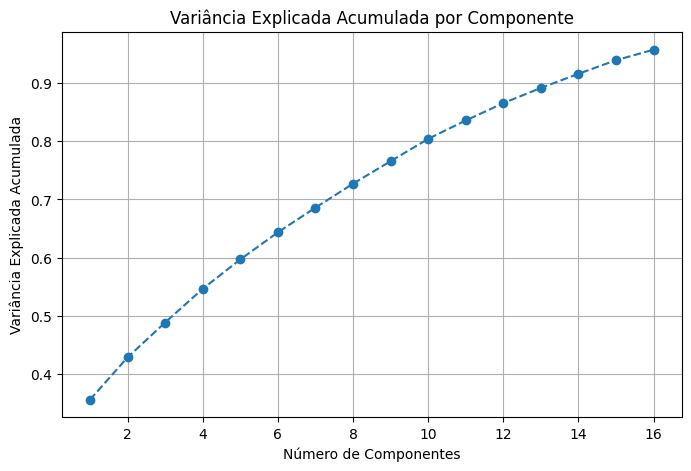

In [164]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# 1Definir o número de componentes (ex: 16)
n_components = 16
pca = PCA(n_components=n_components)

# 2Ajustar PCA aos dados de treino e transformar
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# 3Variância explicada acumulada
cumulative_variance = pca.explained_variance_ratio_.cumsum()
print("Variância explicada acumulada por componente:")
print(cumulative_variance)

# Plotar variância explicada acumulada
plt.figure(figsize=(8,5))
plt.plot(range(1, len(cumulative_variance)+1), cumulative_variance, marker='o', linestyle='--')
plt.title('Variância Explicada Acumulada por Componente')
plt.xlabel('Número de Componentes')
plt.ylabel('Variância Explicada Acumulada')
plt.grid(True)
plt.show()


In [165]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# 1. Padronizar os dados (necessário para PCA)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 2. Aplicar PCA
pca = PCA(n_components=0.95)  # mantém 95% da variância
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

print("Número de componentes após PCA:", X_train_pca.shape[1])

# 3. Treinar modelo (ex: Regressão Logística)
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(random_state=42)
model.fit(X_train_pca, Y_train)

y_pred = model.predict(X_test_pca)

# Avaliar
from sklearn.metrics import classification_report
print(classification_report(Y_test, y_pred))


Número de componentes após PCA: 16
              precision    recall  f1-score   support

           0       0.80      0.83      0.81       308
           1       0.85      0.82      0.83       364

    accuracy                           0.82       672
   macro avg       0.82      0.82      0.82       672
weighted avg       0.83      0.82      0.82       672



**INSIGTH:** PCA só confirmou que nesse caso, apesar de usar padronização de feautures, tratamento, hiperparametros e verificação de correlação de componentes, o random forest é o ML mais indicado para essa predição.